# Part1

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from google.colab.patches import cv2_imshow

In [ ]:
image = cv2.imread('/content/car.jpg')

gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
binary_image = cv2.adaptiveThreshold(gray_image, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)

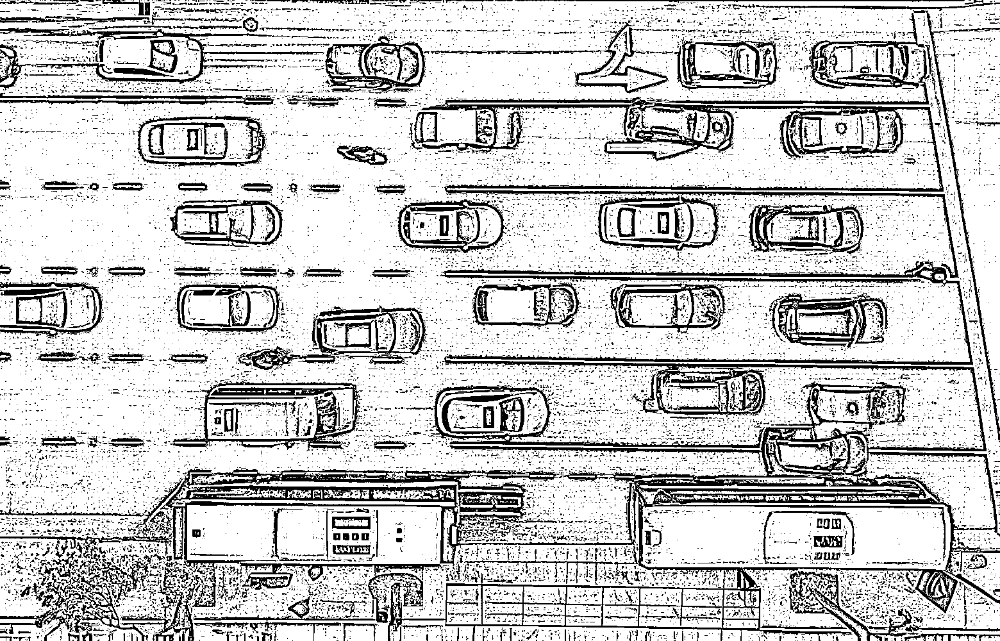

In [ ]:
cv2_imshow(binary_image)

In [ ]:
# Delete noise
oppening = cv2.morphologyEx(binary_image, cv2.MORPH_OPEN, np.ones((8, 8), np.uint8))

# Find countours
contours, _ = cv2.findContours(oppening, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

In [ ]:
min_contour = 4700
car_count = len([contour for contour in contours if cv2.contourArea(contour) > min_contour])

print(f'Number of Detected cars in the image: {car_count}')

Number of Detected cars in the image: 23


# Part2

In [35]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from google.colab.patches import cv2_imshow

In [36]:
flower_image = cv2.imread('/content/flower.jpg')

gray_flower = cv2.cvtColor(flower_image, cv2.COLOR_BGR2GRAY)

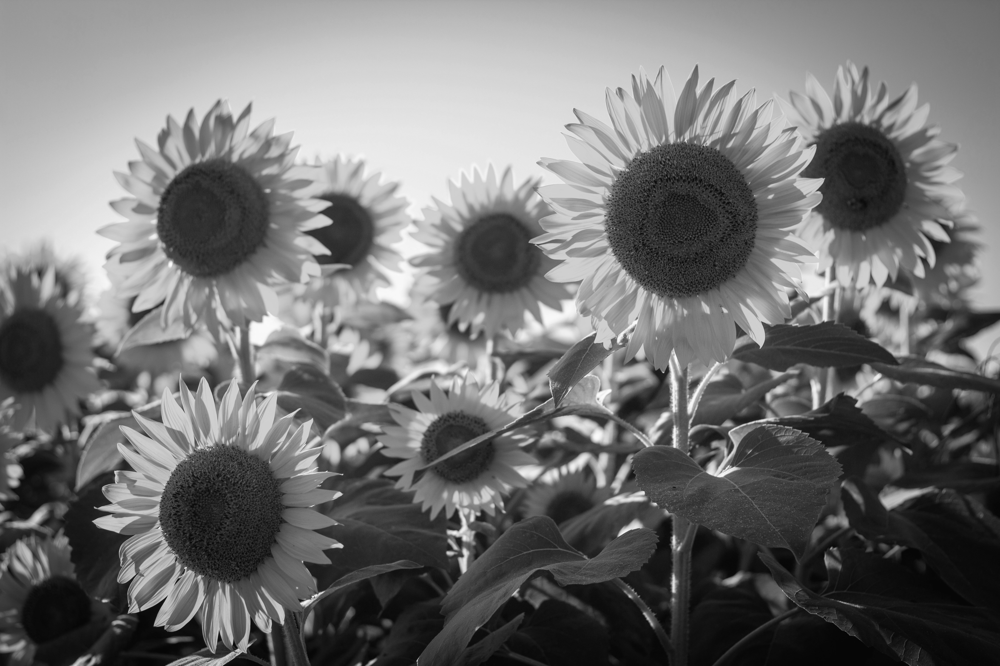

In [37]:
cv2_imshow(gray_flower)

In [38]:
# Apply Gaussian blur
blurred = cv2.GaussianBlur(gray_flower, (15, 15), 0)

In [47]:
# Structuring element for morphological operations
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (15, 15))

# Apply morphological closing
closed = cv2.morphologyEx(blurred, cv2.MORPH_CLOSE, kernel)

# Apply morphological opening
opened = cv2.morphologyEx(closed, cv2.MORPH_OPEN, kernel)

# Threshold the image
_, binary = cv2.threshold(opened, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# Find contours
contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Filter contours by area to remove noise and small detections
min_area = 9000
number_of_sunflowers = len([cnt for cnt in contours if cv2.contourArea(cnt) > min_area])

print(f"Number of sunflowers detected: {number_of_sunflowers}")

Number of sunflowers detected: 17
